# Problem Statement
### You are working for a new-age insurance company and employ mutiple outreach plans to sell term insurance to your customers. Telephonic marketing campaigns still remain one of the most effective way to reach out to people however they incur a lot of cost. Hence, it is important to identify the customers that are most likely to convert beforehand so that they can be specifically targeted via call. We are given the historical marketing data of the insurance company and are required to build a ML model that will predict if a client will subscribe to the insurance.

# Importing the Required Packages

In [183]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import pygwalker as pyg

# Dataset

In [184]:
data = pd.read_csv("train.csv")

In [185]:
data

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y
0,58,management,married,tertiary,unknown,5,may,261,1,unknown,no
1,44,technician,single,secondary,unknown,5,may,151,1,unknown,no
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,unknown,no
3,47,blue-collar,married,unknown,unknown,5,may,92,1,unknown,no
4,33,unknown,single,unknown,unknown,5,may,198,1,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,cellular,17,nov,977,3,unknown,yes
45207,71,retired,divorced,primary,cellular,17,nov,456,2,unknown,yes
45208,72,retired,married,secondary,cellular,17,nov,1127,5,success,yes
45209,57,blue-collar,married,secondary,telephone,17,nov,508,4,unknown,no


##### using the pygwalker jst analyse the data like tableau interface

## Data cleaning Process

In [187]:
data.shape

(45211, 11)

In [188]:
data.isnull().sum()

age               0
job               0
marital           0
education_qual    0
call_type         0
day               0
mon               0
dur               0
num_calls         0
prev_outcome      0
y                 0
dtype: int64

#### Here there is no Null values but the data having the unknown values 

In [189]:
data.drop_duplicates()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y
0,58,management,married,tertiary,unknown,5,may,261,1,unknown,no
1,44,technician,single,secondary,unknown,5,may,151,1,unknown,no
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,unknown,no
3,47,blue-collar,married,unknown,unknown,5,may,92,1,unknown,no
4,33,unknown,single,unknown,unknown,5,may,198,1,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,cellular,17,nov,977,3,unknown,yes
45207,71,retired,divorced,primary,cellular,17,nov,456,2,unknown,yes
45208,72,retired,married,secondary,cellular,17,nov,1127,5,success,yes
45209,57,blue-collar,married,secondary,telephone,17,nov,508,4,unknown,no


#### from the above 6 Duplicates Dropped

In [190]:
data["age"].unique()

array([58, 44, 33, 47, 35, 28, 42, 43, 41, 29, 53, 57, 51, 45, 60, 56, 32,
       25, 40, 39, 52, 46, 36, 49, 59, 37, 50, 54, 55, 48, 24, 38, 31, 30,
       27, 34, 23, 26, 61, 22, 21, 20, 66, 62, 83, 75, 67, 70, 65, 68, 64,
       69, 72, 71, 19, 76, 85, 63, 90, 82, 73, 74, 78, 80, 94, 79, 77, 86,
       95, 81, 18, 89, 84, 87, 92, 93, 88], dtype=int64)

In [191]:
data["job"].unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

In [192]:
data["marital"].unique()

array(['married', 'single', 'divorced'], dtype=object)

In [193]:
data["education_qual"].unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

In [194]:
data["call_type"].unique()

array(['unknown', 'cellular', 'telephone'], dtype=object)

In [195]:
data["mon"].unique()

array(['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep'], dtype=object)

In [196]:
data["prev_outcome"].unique()

array(['unknown', 'failure', 'other', 'success'], dtype=object)

#### doing the value_count for the features

In [197]:
data.age.value_counts()

32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
93       2
90       2
95       2
88       2
94       1
Name: age, Length: 77, dtype: int64

In [198]:
data.job.value_counts()

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

In [199]:
data.marital.value_counts()

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

In [200]:
data.education_qual.value_counts()

secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education_qual, dtype: int64

##### Replacing the unknown  Values as mode for the "job" and "education_qual" feature bcs unknown values are little low.leave the unknown values for other features by values here the two Feature which has multi catogical variable so impute as mode(),  Incase if its continious impute as mean()

In [201]:
data["education_qual"] = data["education_qual"].replace("unknown",data["education_qual"].mode()[0])

In [202]:
data.education_qual.unique()

array(['tertiary', 'secondary', 'primary'], dtype=object)

In [203]:
data["job"] = data["job"].replace("unknown",data["job"].mode()[0])

In [204]:
data["job"].unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'retired', 'admin.', 'services', 'self-employed', 'unemployed',
       'housemaid', 'student'], dtype=object)

In [205]:
data.describe()

,age,day,dur,num_calls
count,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,15.806419,258.163080,2.763841
std,10.618762,8.322476,257.527812,3.098021
min,18.000000,1.000000,0.000000,1.000000
25%,33.000000,8.000000,103.000000,1.000000
50%,39.000000,16.000000,180.000000,2.000000
75%,48.000000,21.000000,319.000000,3.000000
max,95.000000,31.000000,4918.000000,63.000000


In [206]:
#adf = data.loc[["age","day","dur","num_calls"]]
df = data.loc[:,["age","day","dur","num_calls"]]
df

,age,day,dur,num_calls
0,58,5,261,1
1,44,5,151,1
2,33,5,76,1
3,47,5,92,1
4,33,5,198,1
...,...,...,...,...
45206,51,17,977,3
45207,71,17,456,2
45208,72,17,1127,5
45209,57,17,508,4


In [207]:
df.describe()

,age,day,dur,num_calls
count,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,15.806419,258.163080,2.763841
std,10.618762,8.322476,257.527812,3.098021
min,18.000000,1.000000,0.000000,1.000000
25%,33.000000,8.000000,103.000000,1.000000
50%,39.000000,16.000000,180.000000,2.000000
75%,48.000000,21.000000,319.000000,3.000000
max,95.000000,31.000000,4918.000000,63.000000


## IQR and finding the lower and upper thershold

In [208]:
def outlier_presence(df):
    for i in df.keys():
        Q1 = df[i].quantile(0.25)
        Q3 = df[i].quantile(0.75)
        IQR = Q3-Q1
        lower_limit = Q1 - 1.5*IQR
        upper_limit = Q3 + 1.5*IQR
        print("Interquartile Range of " + i + " is", IQR)
        print("Lower_thershold ", lower_limit)
        print("Upper_thershold ", upper_limit)
        outliers = df[(df[i]<lower_limit)|(df[i]>upper_limit)]
        if outliers.shape[0] != 0:
            print("Outlier is Presented In",i )
            print("\n")
        else:
            print("Outlier is Not Presented In",i )
            print("\n")
  
outlier_presence(df)

Interquartile Range of age is 15.0
Lower_thershold  10.5
Upper_thershold  70.5
Outlier is Presented In age


Interquartile Range of day is 13.0
Lower_thershold  -11.5
Upper_thershold  40.5
Outlier is Not Presented In day


Interquartile Range of dur is 216.0
Lower_thershold  -221.0
Upper_thershold  643.0
Outlier is Presented In dur


Interquartile Range of num_calls is 2.0
Lower_thershold  -2.0
Upper_thershold  6.0
Outlier is Presented In num_calls




In [209]:
def Outlier_Data_Points(df):
    for i in df.keys():
        Q1 = df[i].quantile(0.25)
        Q3 = df[i].quantile(0.75)
        IQR = Q3-Q1
        lower_limit = Q1 - 1.5*IQR
        upper_limit = Q3 + 1.5*IQR
        outliers = df[(df[i]<lower_limit)|(df[i]>upper_limit)]
        if outliers.empty:
            print("No Outlier is Presented In",i )
        else:
            print("Outlier is Presented In " + i + " is")
            for j in outliers[i]:
                print(j)
            print("\n")
Outlier_Data_Points(df)

Outlier is Presented In age is
83
75
75
83
75
72
71
76
83
71
85
72
90
71
82
73
74
71
75
78
85
80
71
78
73
75
94
72
83
79
78
83
73
76
83
77
73
74
73
77
71
71
80
82
75
77
78
78
86
76
72
74
77
74
79
71
74
78
73
73
95
74
71
78
71
75
75
82
74
81
76
72
75
72
71
72
77
73
85
83
78
73
79
71
71
80
72
78
79
71
82
81
79
71
79
79
73
75
72
71
75
78
75
80
80
74
73
71
72
72
77
79
73
71
80
71
83
71
73
78
72
81
81
71
74
75
82
80
76
74
74
77
71
71
77
76
72
74
74
72
73
82
77
71
79
89
76
81
74
73
71
71
77
72
84
86
72
72
76
73
74
82
71
83
72
73
73
74
72
78
86
76
79
71
81
77
82
72
73
73
74
71
73
76
71
71
83
71
80
79
77
74
84
95
77
78
79
83
83
73
77
72
74
83
76
73
81
80
75
74
75
77
83
72
81
73
74
80
72
76
72
77
74
87
76
92
78
82
78
76
73
77
76
73
82
81
80
71
76
74
75
72
80
84
87
72
76
78
73
78
81
76
71
79
73
72
82
77
72
75
76
81
77
71
75
74
75
71
78
72
77
83
72
73
81
72
80
80
86
79
71
72
79
87
81
72
75
72
84
78
89
72
73
85
87
80
81
85
79
76
74
92
77
74
81
71
73
76
80
82
72
77
76
72
78
77
74
76
77
80
76
76
71


##### clipping the outlier 

In [210]:
data.age = data.age.clip(10.5,70.5)

In [211]:
data.dur = data.dur.clip(-221,643)

In [212]:
data.num_calls = data.num_calls.clip(-2,6)

def CapOut(df):
  for i in df.keys():
    Q1 = df_cap[i].quantile(0.25)
    Q3 = df_cap[i].quantile(0.75)
    IQR = Q3-Q1
    lower_limit = Q1 - 1.5*IQR
    upper_limit = Q3 + 1.5*IQR
    df_cap[i] = np.where(df_cap[i]upper_limit, upper_limit, df_cap[i])) # Here We Replace The All outliers with whiskers(lower_limit and upper_limit)
    print("Outliers in " + i + " Are Capped Using Capping Method")
  return df_cap
df_cap = CapOut(df_cap)

In [213]:
import warnings
warnings.filterwarnings('ignore')

## Distribution of the Feature Plot

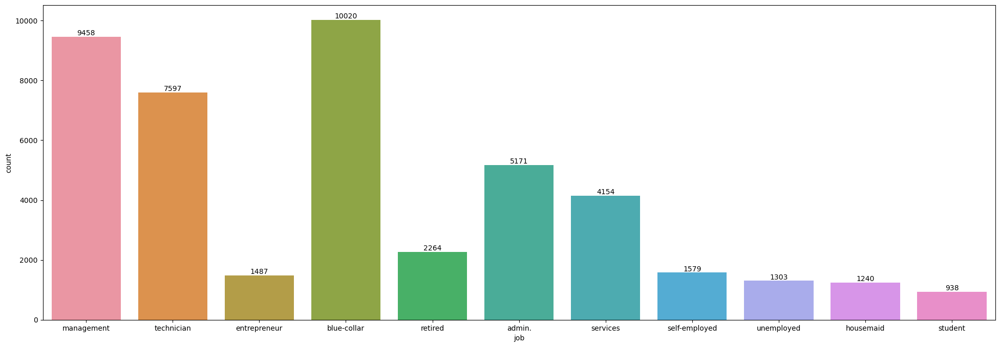

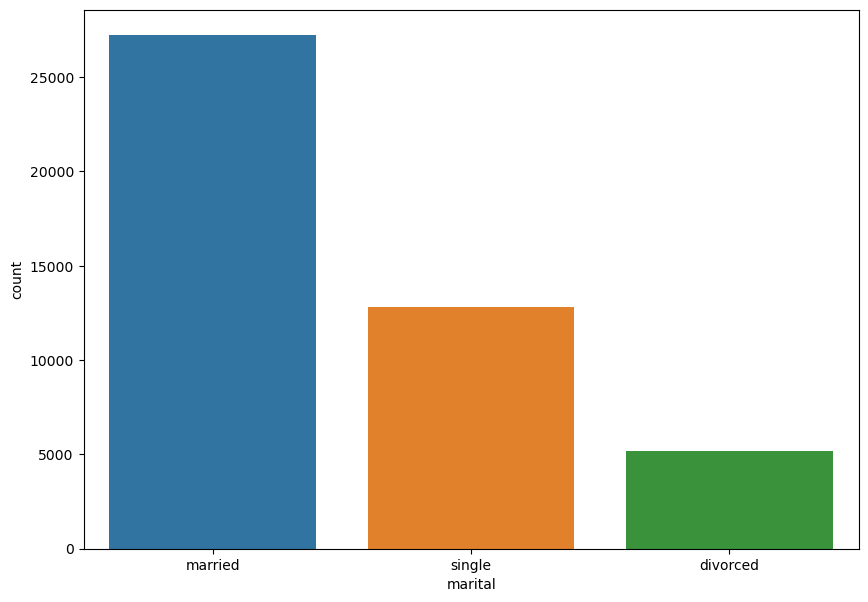

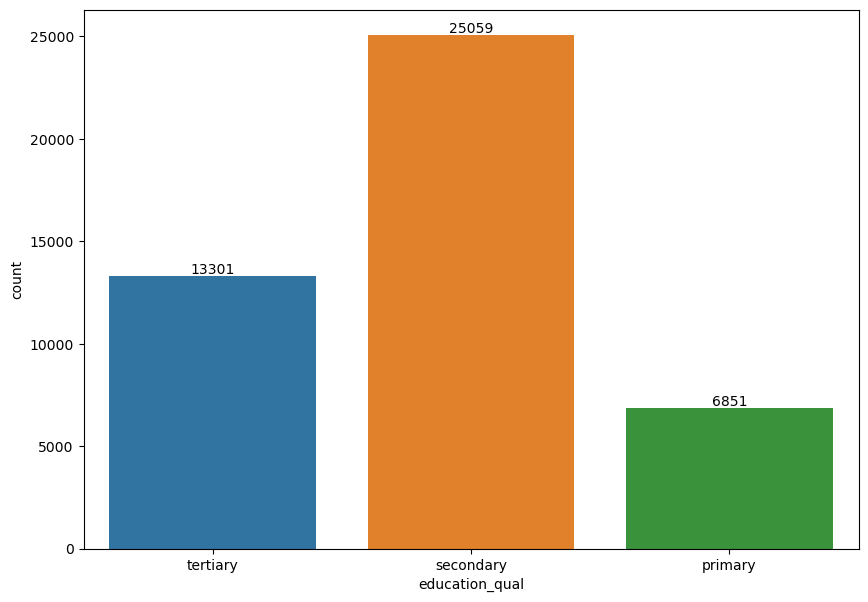

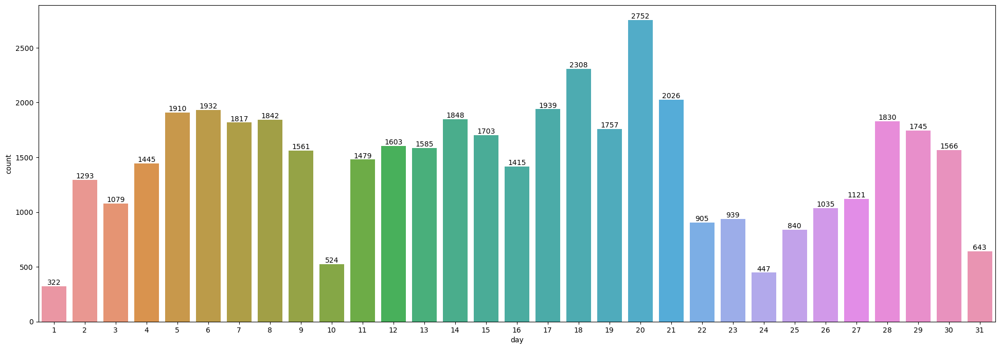

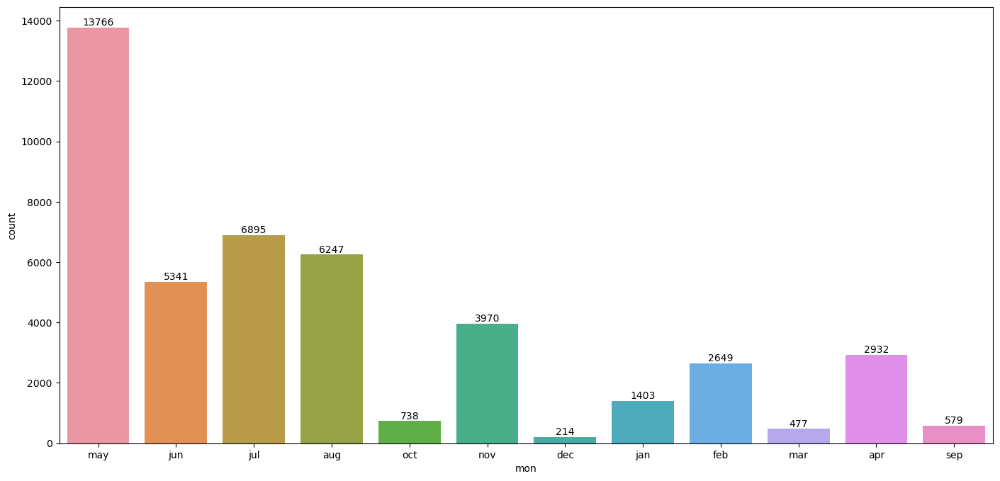

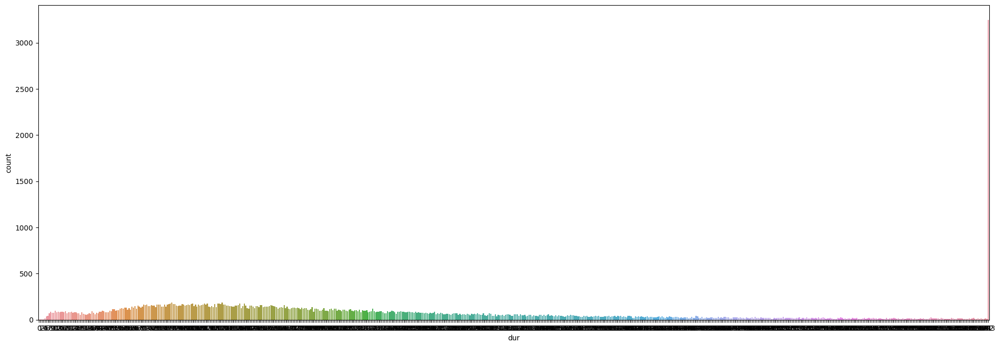

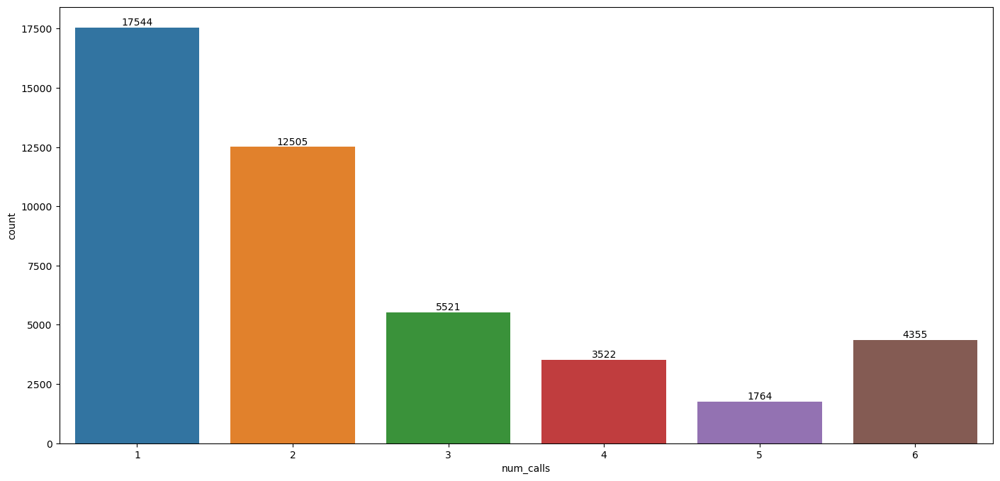

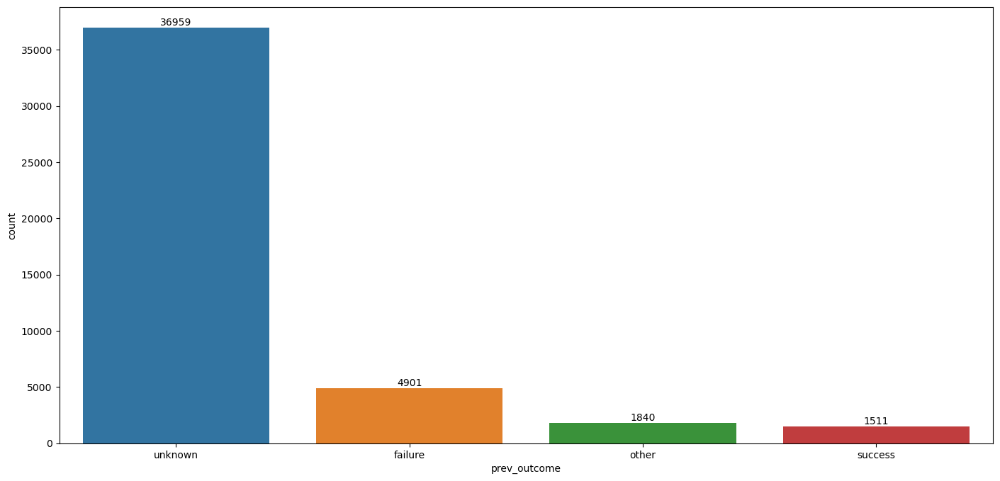

In [214]:
plt.figure(figsize=(24,8))
p = sns.countplot(x='job',data=data)
for container in p.containers:
    p.bar_label(container)
plt.show()

plt.figure(figsize=(10,7))
sns.countplot(x='marital',data=data)
plt.show()

plt.figure(figsize=(10,7))
p = sns.countplot(x='education_qual',data=data)
for container in p.containers:
    p.bar_label(container)
plt.show()

plt.figure(figsize=(24,8))
p = sns.countplot(x='day',data=data)
for container in p.containers:
    p.bar_label(container)
plt.show()


plt.figure(figsize=(17,8))
p = sns.countplot(x='mon',data=data)
for container in p.containers:
    p.bar_label(container)
plt.show()

plt.figure(figsize=(24,8))
sns.countplot(x='dur',data=data)
plt.show()


plt.figure(figsize=(17,8))
p = sns.countplot(x='num_calls',data=data)
for container in p.containers:
    p.bar_label(container)
plt.show()

plt.figure(figsize=(17,8))
p = sns.countplot(x='prev_outcome',data=data)
for container in p.containers:
    p.bar_label(container)
plt.show()


#### Creating the new column of the target variable

In [215]:
data['Target'] = data['y'].replace({'yes': 1, 'no': 0})

In [216]:
data

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,Target
0,58.0,management,married,tertiary,unknown,5,may,261,1,unknown,no,0
1,44.0,technician,single,secondary,unknown,5,may,151,1,unknown,no,0
2,33.0,entrepreneur,married,secondary,unknown,5,may,76,1,unknown,no,0
3,47.0,blue-collar,married,secondary,unknown,5,may,92,1,unknown,no,0
4,33.0,blue-collar,single,secondary,unknown,5,may,198,1,unknown,no,0
...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51.0,technician,married,tertiary,cellular,17,nov,643,3,unknown,yes,1
45207,70.5,retired,divorced,primary,cellular,17,nov,456,2,unknown,yes,1
45208,70.5,retired,married,secondary,cellular,17,nov,643,5,success,yes,1
45209,57.0,blue-collar,married,secondary,telephone,17,nov,508,4,unknown,no,0


In [217]:
del data["y"]

In [218]:
#data.groupby(['job', 'Item_Type'])['Item_Outlet_Sales']\.transform(lambda x: x.mean())

## Distributiion of features vs Target

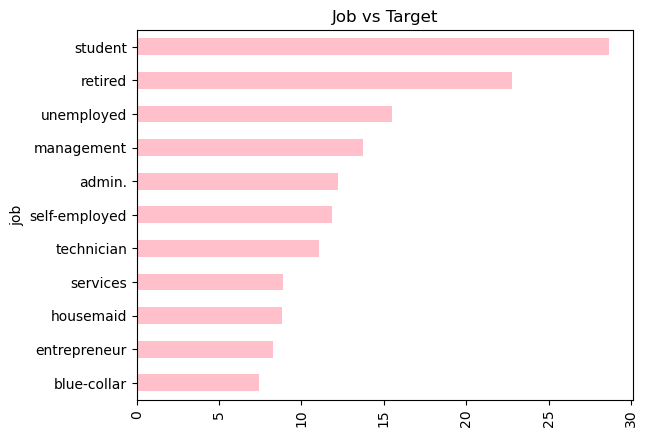

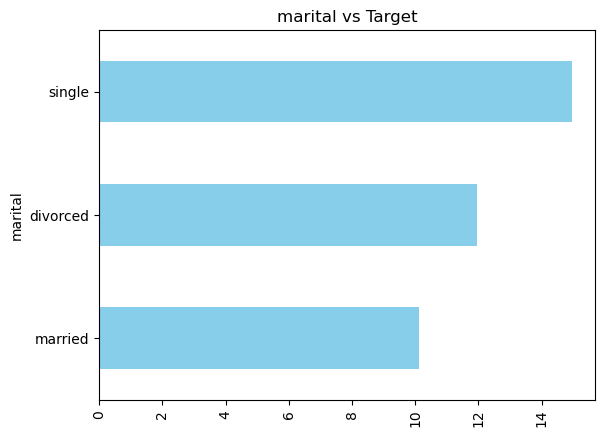

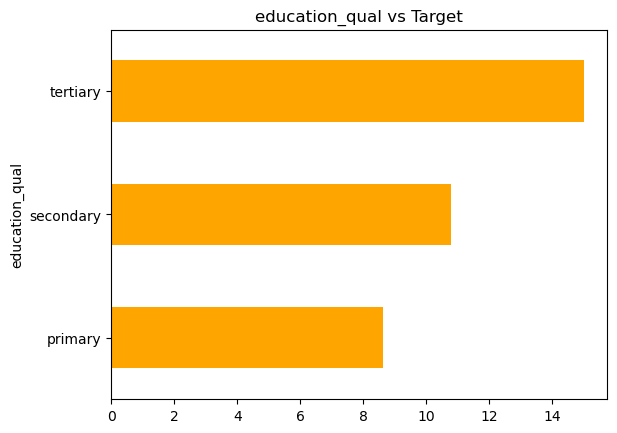

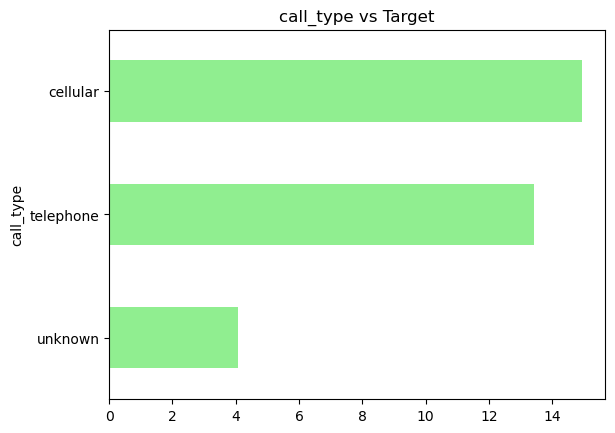

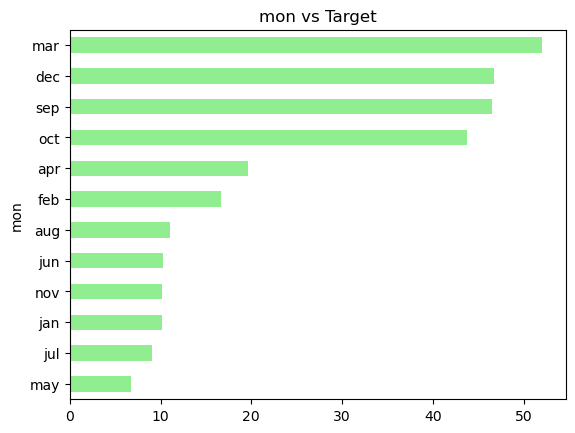

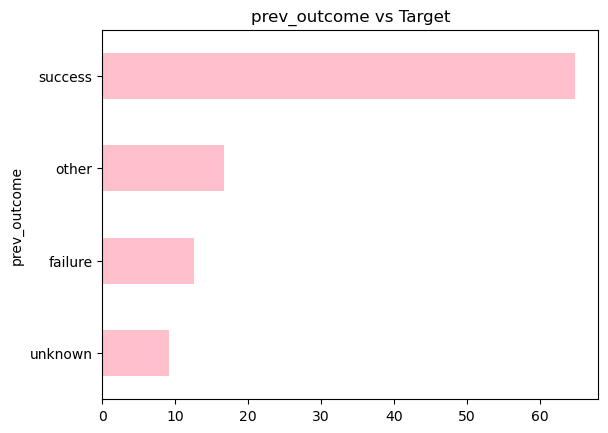

In [219]:

(data.groupby("job")["Target"].mean()*100).sort_values().plot(kind = "barh",color= "pink")
plt.xticks(rotation=90)
plt.title("Job vs Target")
plt.show()


(data.groupby("marital")["Target"].mean()*100).sort_values().plot(kind = "barh",color= "skyblue")
plt.xticks(rotation=90)
plt.title("marital vs Target")
plt.show()


(data.groupby("education_qual")["Target"].mean()*100).sort_values().plot(kind = "barh",color= "orange")
plt.title("education_qual vs Target")
plt.show()


(data.groupby("call_type")["Target"].mean()*100).sort_values().plot(kind = "barh",color= "lightgreen")
plt.title("call_type vs Target")
plt.show()


(data.groupby("mon")["Target"].mean()*100).sort_values().plot(kind = "barh",color= "lightgreen")
plt.title("mon vs Target")
plt.show()



(data.groupby("prev_outcome")["Target"].mean()*100).sort_values().plot(kind = "barh",color= "pink")
plt.title("prev_outcome vs Target")
plt.show()


#### encode
###### For job -('blue-collar':0,'management':7,'technician':4,"admin.":6,"services":3,"retired":9,"self-employed":5,"entrepreneur":1,"unemployed":8,"housemaid":2,"student":10)
###### For marital - ('single':2,'married':0,'divorced':1) 
###### For education_qual -("primary":0,"secondary":1,"tertiary":2)
###### For call_type - ("unknown":0,"telephone":1,"cellular":2)
###### For mon -("may":0,"jul":1,"jan":2,"nov":3,"jun":4,"aug":5,"feb":6,"apr":7,"oct":8,"sep":9,"dec":10,"mar":11)        
###### For prev_outcome - ('unknown':0, 'failure':1, 'other':2, 'success':3)

In [220]:
data.corr()

,age,day,dur,num_calls,Target
age,1.000000,-0.008843,-0.014287,0.025791,0.018976
day,-0.008843,1.000000,-0.039285,0.152975,-0.028348
dur,-0.014287,-0.039285,1.000000,-0.100049,0.390659
num_calls,0.025791,0.152975,-0.100049,1.000000,-0.084061
Target,0.018976,-0.028348,0.390659,-0.084061,1.000000


<AxesSubplot:>

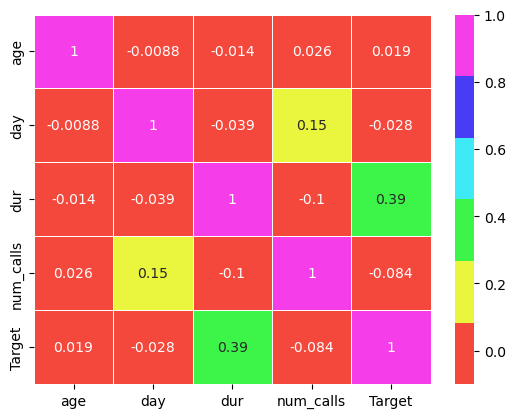

In [221]:
sns.heatmap(data.corr(), annot=True, linewidth=.5,cmap=sns.hls_palette(s=0.9))   #sns.hls_palette(h=.5)

## Data Encoding

###### by the above Distribution of Feature vs Target plot 

In [222]:
data.job = data.job.map({'blue-collar':0,'management':7,'technician':4,"admin.":6,"services":3,"retired":9,
                         "self-employed":5,"entrepreneur":1,"unemployed":8,"housemaid":2,"student":10})

data.marital = data.marital.map({'single':2,'married':0,'divorced':1})

data.education_qual = data.education_qual.map({"primary":0,"secondary":1,"tertiary":2})

data.mon = data.mon.map({"jan":2,"feb":6,"mar":11,"apr":7,"may":0,"jun":4,"jul":1,
                         "aug":5,"sep":9,"oct":8,"nov":3,"dec":10})

data.prev_outcome = data.prev_outcome.map({"unknown":0,"failure":1,"other":2,"success":3})

data.call_type = data.call_type.map({"unknown":0,"telephone":1,"cellular":2})

In [223]:
data

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,Target
0,58.0,7,0,2,0,5,0,261,1,0,0
1,44.0,4,2,1,0,5,0,151,1,0,0
2,33.0,1,0,1,0,5,0,76,1,0,0
3,47.0,0,0,1,0,5,0,92,1,0,0
4,33.0,0,2,1,0,5,0,198,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
45206,51.0,4,0,2,2,17,3,643,3,0,1
45207,70.5,9,1,0,2,17,3,456,2,0,1
45208,70.5,9,0,1,2,17,3,643,5,3,1
45209,57.0,0,0,1,1,17,3,508,4,0,0


<AxesSubplot:>

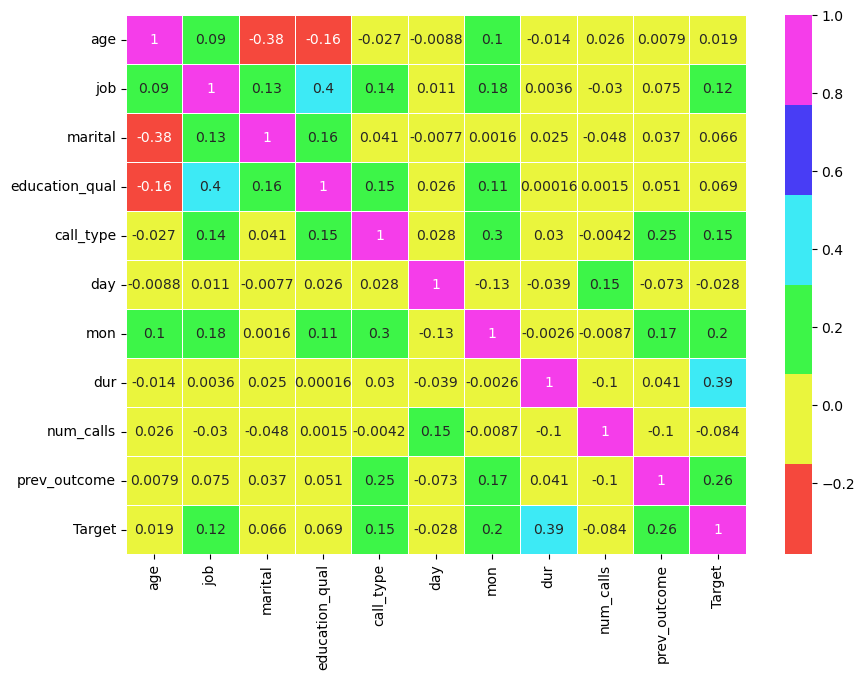

In [224]:
plt.figure(figsize=(10,7))
sns.heatmap(data.corr(), annot=True, linewidth=.5,cmap=sns.hls_palette(s=0.9))

###### Decent correlated - so selecting the feature of(" job, calltype,education_qual, *prev_outcome, mon, *dur").  total 10 features showing 6 prettty decent features we can select for X
###### Not corelated fea ,there is no corr() for age marital,day,num_calls

### Splitting the Data

In [225]:
from sklearn.model_selection import train_test_split
X = data.loc[:, ["age","job","marital","education_qual","call_type","day","mon","dur","num_calls","prev_outcome"]].values 
y = data.loc[:, 'Target'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,random_state = 6)

In [226]:
X_train

array([[ 33.,   3.,   0., ..., 163.,   2.,   0.],
       [ 39.,   4.,   0., ..., 643.,   1.,   0.],
       [ 35.,   0.,   0., ..., 249.,   2.,   0.],
       ...,
       [ 23.,  10.,   2., ..., 643.,   2.,   1.],
       [ 59.,   7.,   0., ..., 643.,   1.,   0.],
       [ 33.,   4.,   2., ..., 583.,   2.,   1.]])

In [227]:
def plot_2d_space(X, y, label='Classes'):   
    colors = ['#1F77B4', '#FF7F0E']
    markers = ['o', 's']
    for l, c, m in zip(np.unique(y), colors, markers):
        plt.scatter(
            X[y==l, 0],
            X[y==l, 1],
            c=c, label=l, marker=m
        )
    plt.title(label)
    plt.legend(loc='upper right')
    plt.show()

### Balancing the train data

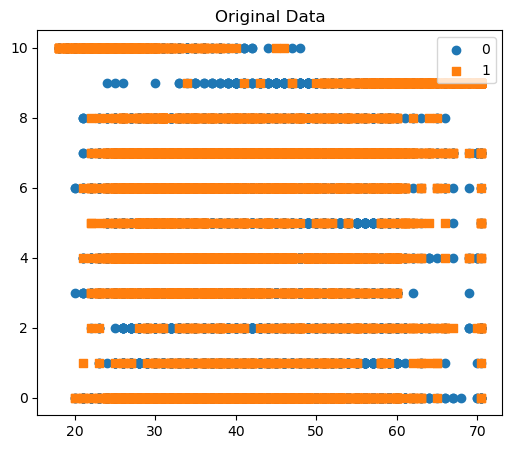

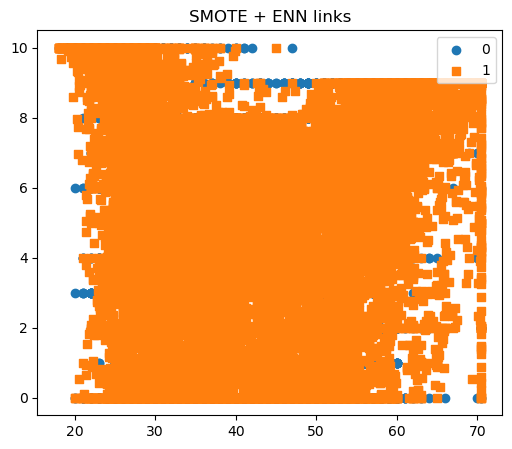

In [228]:
from imblearn.combine import SMOTEENN

plt.figure(figsize=(6,5))
plot_2d_space(X, y, 'Original Data')

smt = SMOTEENN(sampling_strategy='all')
X_smt, y_smt = smt.fit_resample(X_train, y_train)
plt.figure(figsize=(6,5))
plot_2d_space(X_smt, y_smt, 'SMOTE + ENN links')

In [229]:
X_smt.shape

(51457, 10)

In [230]:
len(X_smt),len(y_smt)

(51457, 51457)

In [231]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn import svm

In [232]:
pipe_logi = Pipeline([('pca',PCA()),
                    ('scl', StandardScaler()),
                    ('LR', LogisticRegression(random_state=202))])
pipe_dec_t = Pipeline([('pca',PCA()),
                    ('scl', StandardScaler()),
                    ('DT',DecisionTreeClassifier(random_state=222))])
pipe_rand_f = Pipeline([('pca',PCA()),
                    ('scl', StandardScaler()),
                    ('RF',RandomForestClassifier(random_state=22))])
pipe_knn = Pipeline([('pca',PCA()),
                     ('scl', StandardScaler()),
                    ('KNN', KNeighborsClassifier())])
pipe_svm = Pipeline([('pca',PCA()),
                     ('scl', StandardScaler()),
                     ('SVM', svm.SVC(random_state=2))])
pipe_xgboost = Pipeline([('pca',PCA()),
                     ('scl', StandardScaler()),
                     ('XGB', XGBClassifier(random_state=19))])

In [233]:

lr_param_grid = [{'LR__penalty': ['l2'],'LR__C':[2.0]}]
dt_param_grid = [{'DT__criterion': ['gini', 'entropy'],'DT__max_depth': [3,4,5,6,7]}]
rf_param_grid = [{'RF__criterion':['gini'],'RF__n_estimators':[10]}]
knn_param_grid = [{'KNN__n_neighbors':[10],'KNN__weights': ['uniform', 'distance'],'KNN__metric': ['euclidean']}]
svm_param_grid = [{'SVM__kernel': ['linear', 'rbf'], 'SVM__C':[6]}]
xgb_param_grid = [{'XGB__learning_rate': [0.3,0.5,0.6,0.8,1.0],'XGB__max_depth':[6]}]
cv=StratifiedKFold(n_splits=3)

In [234]:
lr_grid_search = GridSearchCV(estimator=pipe_logi,
        param_grid=lr_param_grid,
        scoring='roc_auc',
        cv=cv)
dt_grid_search = GridSearchCV(estimator=pipe_dec_t,
        param_grid=dt_param_grid,
        scoring='roc_auc',
        cv=cv)
rf_grid_search = GridSearchCV(estimator=pipe_rand_f,
        param_grid=rf_param_grid,
        scoring='roc_auc',
        cv=cv)
knn_grid_search = GridSearchCV(estimator=pipe_knn,
        param_grid=knn_param_grid,
        scoring='roc_auc',
        cv=cv)
svm_grid_search = GridSearchCV(estimator=pipe_svm,
        param_grid=svm_param_grid,
        scoring='roc_auc',
        cv=cv)
xgb_grid_search = GridSearchCV(estimator=pipe_xgboost,
        param_grid=xgb_param_grid,
        scoring='roc_auc',
        cv=cv)

In [235]:
from collections import Counter
print(Counter(y_train))
print(Counter(y_smt))

Counter({0: 29974, 1: 3934})
Counter({1: 28817, 0: 22640})


In [237]:
grids = [lr_grid_search, dt_grid_search, rf_grid_search, knn_grid_search, svm_grid_search, xgb_grid_search]
for pipe in grids:
    pipe.fit(X_smt, y_smt)

In [238]:
from sklearn.metrics import roc_auc_score, classification_report
grid_dict = {0: 'Logistic Regression', 1: 'Decision Trees', 
             2: 'Random Forest', 3: 'K-Nearest Neighbors', 
             4: 'Support Vector Machines', 5: 'XGBoost'}
for i, model in enumerate(grids):
    print('{} Test Accuracy: {}'.format(grid_dict[i],model.score(X_test,y_test)))
    y_pred=model.predict(X_test)
    print("AUROC:",roc_auc_score(y_test,y_pred))
    print(classification_report(y_test,y_pred))

Logistic Regression Test Accuracy: 0.8937706702157492
AUROC: 0.8224762120962585
              precision    recall  f1-score   support

           0       0.98      0.76      0.86      9948
           1       0.34      0.88      0.49      1355

    accuracy                           0.78     11303
   macro avg       0.66      0.82      0.67     11303
weighted avg       0.90      0.78      0.81     11303

Decision Trees Test Accuracy: 0.8797007909765466
AUROC: 0.8155770152393924
              precision    recall  f1-score   support

           0       0.98      0.74      0.85      9948
           1       0.32      0.89      0.47      1355

    accuracy                           0.76     11303
   macro avg       0.65      0.82      0.66     11303
weighted avg       0.90      0.76      0.80     11303

Random Forest Test Accuracy: 0.8945918035778668
AUROC: 0.8248961388890126
              precision    recall  f1-score   support

           0       0.97      0.84      0.90      9948
        

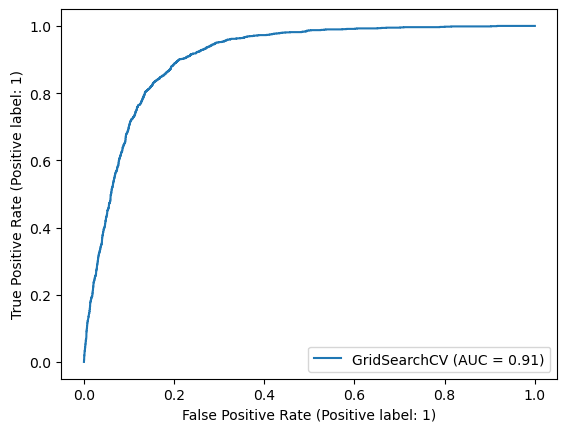

In [239]:
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_estimator(xgb_grid_search,X_test,y_test)

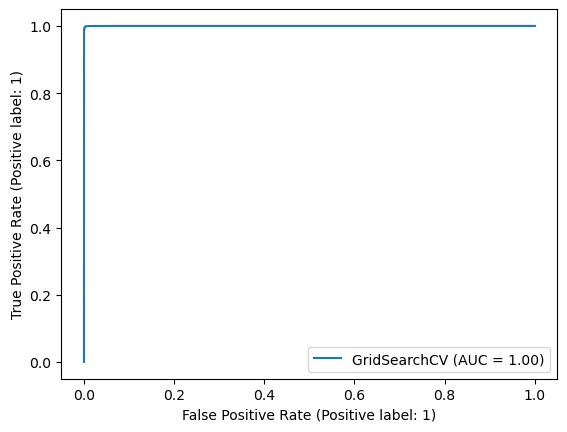

In [240]:
RocCurveDisplay.from_estimator(xgb_grid_search,X_smt,y_smt)

In [242]:
thresholds = list(zip(xgb_grid_search.best_estimator_.named_steps["XGB"].feature_importances_, data.drop("Target",axis=1)))
imp = pd.DataFrame(thresholds, columns = ["Importance","Feature"])
imp.sort_values("Importance",ascending = False,inplace=True,ignore_index=True)
imp

,Importance,Feature
0,0.323325,age
1,0.216766,education_qual
2,0.098286,mon
3,0.084264,num_calls
4,0.058137,call_type
5,0.049269,job
6,0.047721,marital
7,0.044685,day
8,0.040672,dur
9,0.036874,prev_outcome


### Above which are the important feature

## output summary of feature importance
By the above feature importance we can try the get dummies for call_type and job

The Age vs call type -- unknown(0) who is the month of April who 91% and month of March who buy 57% which was the 2 highest of the total age telephone(1) who is the month of march buy 45% of the total age cellular(2) who is the month of march buys 54% of the total age

on the Education qualification with job--primary(0) student buys 35% after retired people buys 24% secondary(1) student who buys 28% teritary(2) Retired people buys 29% Month--Highest of the Enterprioner on March who Buys 100% on the age vs call_type,education_qual,job student with unknown as calltype who buys 35% highest of three

we can Do more as much we need...from visualisation part

In [118]:
pyg.walk(data,hideDataSourceConfig=True, themeKey='vega',
         dark='dark')                         #in this pygwalker we can anlayse teh data in Tableau like in open sourse.

In [ ]:
# For job -('blue-collar':0,'management':7,'technician':4,"admin.":6,"services":3,"retired":9,
#          "self-employed":5,"entrepreneur":1,"unemployed":8,"housemaid":2,"student":10)

# For marital - ('single':2,'married':0,'divorced':1)

#For education_qual -("primary":0,"secondary":1,"tertiary":2)

#For call_type - ("unknown":0,"telephone":1,"cellular":2)

#For mon - ("may":0,"jul":1,"jan":2,"nov":3,"jun":4,"aug":5,"feb":6,"apr":7,"oct":8,"sep":9,"dec":10,"mar":11)
          
#For prev_outcome - ('unknown':0, 'failure':1, 'other':2, 'success':3)

### output summary of feature importance

By the above feature importance we can try the get dummies for call_type and job

The Age vs call type -- unknown(0) who is the month of April who 91% and month of March who buy 57% which was the 2 highest of the total age
                        telephone(1) who is the month of march buy 45%  of the total age
                        cellular(2) who is the month of march buys 54% of the total age

on the Education qualification with job--primary(0) student buys 35% after retired people buys 24%
                                        secondary(1) student who buys 28%
                                        teritary(2) Retired people buys 29% 
                            Month--Highest of the Enterprioner on March who Buys 100%
on the age vs call_type,education_qual,job   student with unknown as calltype who buys 35% highest of three 

we can Do more as much we need...from visualisation part

## The Important Features are 
 #### 1.Age
 #### 2. education_qual
 #### 3.mon
 #### 4.num_calls